In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [3]:
df=pd.read_csv('/content/gdrive/MyDrive/Dataset and Details/Dataset.csv')
df.head()

,EventId,DER_mass_MMC,DER_mass_transverse_met_lep,DER_mass_vis,DER_pt_h,DER_deltaeta_jet_jet,DER_mass_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_sum_pt,DER_pt_ratio_lep_tau,DER_met_phi_centrality,DER_lep_eta_centrality,PRI_tau_pt,PRI_tau_eta,PRI_tau_phi,PRI_lep_pt,PRI_lep_eta,PRI_lep_phi,PRI_met,PRI_met_phi,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,PRI_jet_all_pt,Weight,Label
0,100000,138.470,51.655,97.827,27.980,0.91,124.711,2.666,3.064,41.928,197.760,1.582,1.396,0.2,32.638,1.017,0.381,51.626,2.273,-2.414,16.824,-0.277,258.733,2,67.435,2.150,0.444,46.062,1.24,-2.475,113.497,0.002653,s
1,100001,160.937,68.768,103.235,48.146,-999.00,-999.000,-999.000,3.473,2.078,125.157,0.879,1.414,-999.0,42.014,2.039,-3.011,36.918,0.501,0.103,44.704,-1.916,164.546,1,46.226,0.725,1.158,-999.000,-999.00,-999.000,46.226,2.233584,b
2,100002,-999.000,162.172,125.953,35.635,-999.00,-999.000,-999.000,3.148,9.336,197.814,3.776,1.414,-999.0,32.154,-0.705,-2.093,121.409,-0.953,1.052,54.283,-2.186,260.414,1,44.251,2.053,-2.028,-999.000,-999.00,-999.000,44.251,2.347389,b
3,100003,143.905,81.417,80.943,0.414,-999.00,-999.000,-999.000,3.310,0.414,75.968,2.354,-1.285,-999.0,22.647,-1.655,0.010,53.321,-0.522,-3.100,31.082,0.060,86.062,0,-999.000,-999.000,-999.000,-999.000,-999.00,-999.000,-0.000,5.446378,b
4,100004,175.864,16.915,134.805,16.405,-999.00,-999.000,-999.000,3.891,16.405,57.983,1.056,-1.385,-999.0,28.209,-2.197,-2.231,29.774,0.798,1.569,2.723,-0.871,53.131,0,-999.000,-999.000,-999.000,-999.000,-999.00,-999.000,0.000,6.245333,b


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 250000 entries, 0 to 249999
Data columns (total 33 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   EventId                      250000 non-null  int64  
 1   DER_mass_MMC                 250000 non-null  float64
 2   DER_mass_transverse_met_lep  250000 non-null  float64
 3   DER_mass_vis                 250000 non-null  float64
 4   DER_pt_h                     250000 non-null  float64
 5   DER_deltaeta_jet_jet         250000 non-null  float64
 6   DER_mass_jet_jet             250000 non-null  float64
 7   DER_prodeta_jet_jet          250000 non-null  float64
 8   DER_deltar_tau_lep           250000 non-null  float64
 9   DER_pt_tot                   250000 non-null  float64
 10  DER_sum_pt                   250000 non-null  float64
 11  DER_pt_ratio_lep_tau         250000 non-null  float64
 12  DER_met_phi_centrality       250000 non-null  float64
 13 

In [5]:
df['Label'].unique()

array(['s', 'b'], dtype=object)

In [6]:
#Converting Label to 0,1
from sklearn.preprocessing import LabelEncoder
le=LabelEncoder()
df['Label']=le.fit_transform(df['Label'])
df['Label'].unique()

array([1, 0])

In [7]:
df.isnull().sum()

EventId                        0
DER_mass_MMC                   0
DER_mass_transverse_met_lep    0
DER_mass_vis                   0
DER_pt_h                       0
DER_deltaeta_jet_jet           0
DER_mass_jet_jet               0
DER_prodeta_jet_jet            0
DER_deltar_tau_lep             0
DER_pt_tot                     0
DER_sum_pt                     0
DER_pt_ratio_lep_tau           0
DER_met_phi_centrality         0
DER_lep_eta_centrality         0
PRI_tau_pt                     0
PRI_tau_eta                    0
PRI_tau_phi                    0
PRI_lep_pt                     0
PRI_lep_eta                    0
PRI_lep_phi                    0
PRI_met                        0
PRI_met_phi                    0
PRI_met_sumet                  0
PRI_jet_num                    0
PRI_jet_leading_pt             0
PRI_jet_leading_eta            0
PRI_jet_leading_phi            0
PRI_jet_subleading_pt          0
PRI_jet_subleading_eta         0
PRI_jet_subleading_phi         0
PRI_jet_al

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
EventId,250000.0,224999.500000,72168.927986,100000.000000,162499.750000,224999.500000,287499.250000,349999.000000
DER_mass_MMC,250000.0,-49.023079,406.345647,-999.000000,78.100750,105.012000,130.606250,1192.026000
DER_mass_transverse_met_lep,250000.0,49.239819,35.344886,0.000000,19.241000,46.524000,73.598000,690.075000
DER_mass_vis,250000.0,81.181982,40.828691,6.329000,59.388750,73.752000,92.259000,1349.351000
DER_pt_h,250000.0,57.895962,63.655682,0.000000,14.068750,38.467500,79.169000,2834.999000
DER_deltaeta_jet_jet,250000.0,-708.420675,454.480565,-999.000000,-999.000000,-999.000000,0.490000,8.503000
DER_mass_jet_jet,250000.0,-601.237051,657.972302,-999.000000,-999.000000,-999.000000,83.446000,4974.979000
DER_prodeta_jet_jet,250000.0,-709.356603,453.019877,-999.000000,-999.000000,-999.000000,-4.593000,16.690000
DER_deltar_tau_lep,250000.0,2.373100,0.782911,0.208000,1.810000,2.491500,2.961000,5.684000
DER_pt_tot,250000.0,18.917332,22.273494,0.000000,2.841000,12.315500,27.591000,2834.999000


In [9]:
kp=df.drop(['EventId','Label'],axis=1)

In [10]:
#Clearly there is no null values
#So checking the outliers
for i in df[kp.columns]:
    if ((df[i].skew()>1)|(df[i].skew()<-1)):
        a=df[i].quantile(0.05)
        b=df[i].quantile(0.95)
        df[i] = np.where(df[i] <a,a,df[i])
        df[i] = np.where(df[i] >b,b,df[i])
        print(i,df[i].skew())
    else:
        print(i,df[i].skew())

DER_mass_MMC -1.903742954029766
DER_mass_transverse_met_lep 0.19045204005320363
DER_mass_vis 0.8982634046163767
DER_pt_h 1.1109745119038785
DER_deltaeta_jet_jet 0.9246946636956436
DER_mass_jet_jet 1.0443800964626593
DER_prodeta_jet_jet 0.9247405514436711
DER_deltar_tau_lep -0.21578158719831483
DER_pt_tot 0.8537154345495686
DER_sum_pt 1.0989669758536047
DER_pt_ratio_lep_tau 0.6977296926919205
DER_met_phi_centrality 0.15113626592477555
DER_lep_eta_centrality 0.9246813016872827
PRI_tau_pt 1.1613831985018666
PRI_tau_eta 0.017852286597790066
PRI_tau_phi 0.013872224673115519
PRI_lep_pt 1.0924483957169593
PRI_lep_eta 0.021623444546247567
PRI_lep_phi -0.04574624612035296
PRI_met 0.9327122549158263
PRI_met_phi 0.007907760109673152
PRI_met_sumet 0.827990535765883
PRI_jet_num 0.6112801392370313
PRI_jet_leading_pt -0.38372652058371437
PRI_jet_leading_eta -0.4097065206742718
PRI_jet_leading_phi -0.40970572305270025
PRI_jet_subleading_pt 0.9292297551275279
PRI_jet_subleading_eta 0.9246998200671448
P

In [11]:
#DER_mass_MMC,DER_pt_h,DER_mass_jet_jet,DER_sum_pt,PRI_tau_pt,PRI_lep_pt,PRI_jet_all_pt
#has huge amount of outliers so it would be best to remove it out
for i in df[kp.columns]:
    if ((df[i].skew()>1)|(df[i].skew()<-1)):
        a=df[i].quantile(0.16)
        b=df[i].quantile(0.84)
        df[i] = np.where(df[i] <a,a,df[i])
        df[i] = np.where(df[i] >b,b,df[i])
        print(i,df[i].skew())
    else:
        print(i,df[i].skew())

DER_mass_MMC -0.5395308576322029
DER_mass_transverse_met_lep 0.19045204005320363
DER_mass_vis 0.8982634046163767
DER_pt_h 0.43866540903105816
DER_deltaeta_jet_jet 0.9246946636956436
DER_mass_jet_jet 0.9339461004388476
DER_prodeta_jet_jet 0.9247405514436711
DER_deltar_tau_lep -0.21578158719831483
DER_pt_tot 0.8537154345495686
DER_sum_pt 0.5084136920222525
DER_pt_ratio_lep_tau 0.6977296926919205
DER_met_phi_centrality 0.15113626592477555
DER_lep_eta_centrality 0.9246813016872827
PRI_tau_pt 0.5095932055794388
PRI_tau_eta 0.017852286597790066
PRI_tau_phi 0.013872224673115519
PRI_lep_pt 0.4244958053152971
PRI_lep_eta 0.021623444546247567
PRI_lep_phi -0.04574624612035296
PRI_met 0.9327122549158263
PRI_met_phi 0.007907760109673152
PRI_met_sumet 0.827990535765883
PRI_jet_num 0.6112801392370313
PRI_jet_leading_pt -0.38372652058371437
PRI_jet_leading_eta -0.4097065206742718
PRI_jet_leading_phi -0.40970572305270025
PRI_jet_subleading_pt 0.9292297551275279
PRI_jet_subleading_eta 0.9246998200671448

In [12]:
df.drop(['DER_mass_MMC','DER_pt_h','DER_mass_jet_jet','DER_sum_pt','PRI_tau_pt','PRI_lep_pt','PRI_jet_all_pt'], axis = 1,inplace=True)

In [ ]:
# Randomly sample 1% of your dataframe
df_percent = df.sample(frac=0.01)
df_percent

,EventId,DER_mass_transverse_met_lep,DER_mass_vis,DER_deltaeta_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_pt_ratio_lep_tau,DER_met_phi_centrality,DER_lep_eta_centrality,...,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,Weight,Label
153714,253714,37.500,70.642,-999.000,-999.000,2.852,1.776,1.046,-1.223,-999.000,...,112.9620,1,33.863,-1.570,-0.713,-999.000,-999.000,-999.000,2.413414,0
71792,171792,83.400,104.596,-999.000,-999.000,2.494,1.343,1.170,-1.409,-999.000,...,153.5770,0,-999.000,-999.000,-999.000,-999.000,-999.000,-999.000,4.405623,0
15000,115000,4.166,102.140,-999.000,-999.000,3.153,3.108,0.906,-1.403,-999.000,...,128.6810,0,-999.000,-999.000,-999.000,-999.000,-999.000,-999.000,0.018636,1
18009,118009,29.240,99.010,-999.000,-999.000,1.214,23.884,0.488,-0.674,-999.000,...,449.8732,1,181.035,-0.722,-2.742,-999.000,-999.000,-999.000,0.002653,1
6569,106569,30.320,74.336,-999.000,-999.000,2.588,1.400,1.072,1.410,-999.000,...,104.9990,1,39.967,-0.367,2.793,-999.000,-999.000,-999.000,0.018636,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171337,271337,41.637,93.143,-999.000,-999.000,2.481,5.868,0.801,-1.269,-999.000,...,164.1780,1,33.488,-3.064,-2.110,-999.000,-999.000,-999.000,0.018636,1
196804,296804,20.593,58.072,1.023,5.126,0.724,26.958,0.488,1.414,0.028,...,449.8732,2,374.118,1.810,2.059,31.708,2.832,0.139,0.073899,0
24302,124302,72.413,48.217,-999.000,-999.000,1.796,11.203,1.670,-1.408,-999.000,...,94.4360,0,-999.000,-999.000,-999.000,-999.000,-999.000,-999.000,2.386403,0
37279,137279,15.307,45.744,-999.000,-999.000,1.709,19.740,1.251,1.298,-999.000,...,222.0780,1,102.280,1.757,-0.495,-999.000,-999.000,-999.000,1.454848,0


In [ ]:
from autoviz.AutoViz_Class import AutoViz_Class

AV = AutoViz_Class()

Imported AutoViz_Class version: 0.0.83. Call using:
    AV = AutoViz_Class()
    AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)
Note: verbose=0 or 1 generates charts and displays them in your local Jupyter notebook.
      verbose=2 does not show plot but creates them and saves them in AutoViz_Plots directory in your local machine.


Shape of your Data Set loaded: (2500, 26)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    Number of Numeric Columns =  23
    Number of Integer-Categorical Columns =  1
    Number of String-Categorical Columns =  0
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  0
    Number of Numeric-Boolean Columns =  1
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  1
    Number of Columns to Delete =  0
    26 Predictors classified...
        This does not include the Target column(s)
        1 variables removed since they were ID or low-information variables
    List of variables removed: ['EventId']
Data Set Shape: 2500 rows, 25 cols
Data Set columns info:
* DER_mass_transverse_met_lep: 0 nulls, 2220 unique vals, most common: {3.3889500000000004: 134, 104.64419999999996: 124}
* DER_mass_vis: 

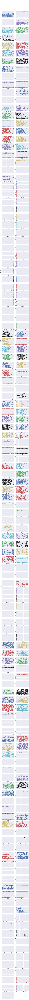

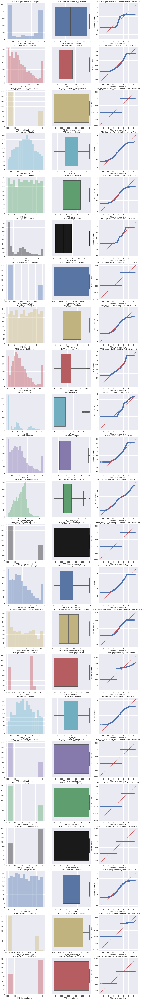

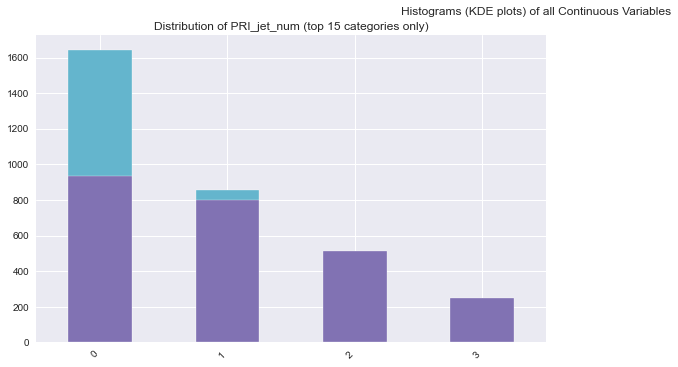

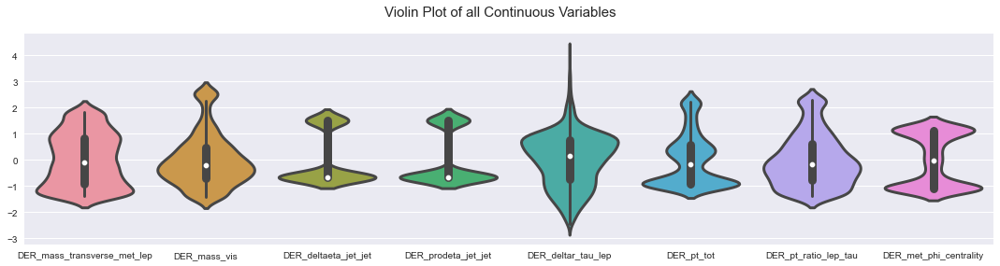

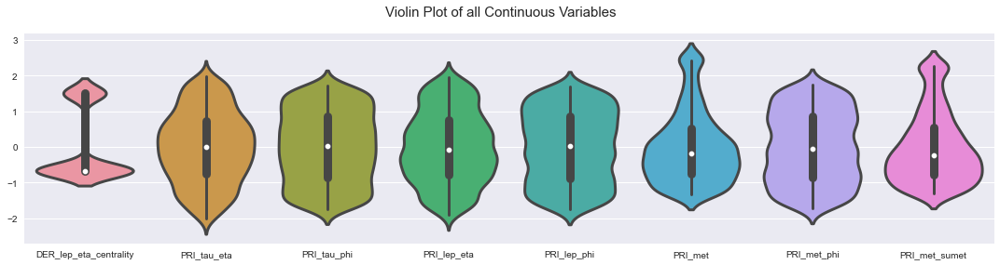

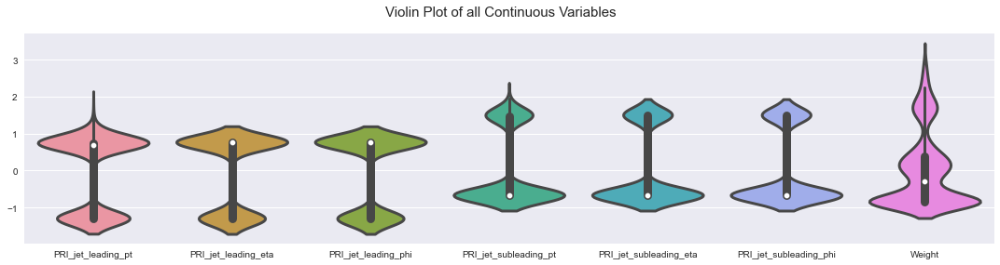

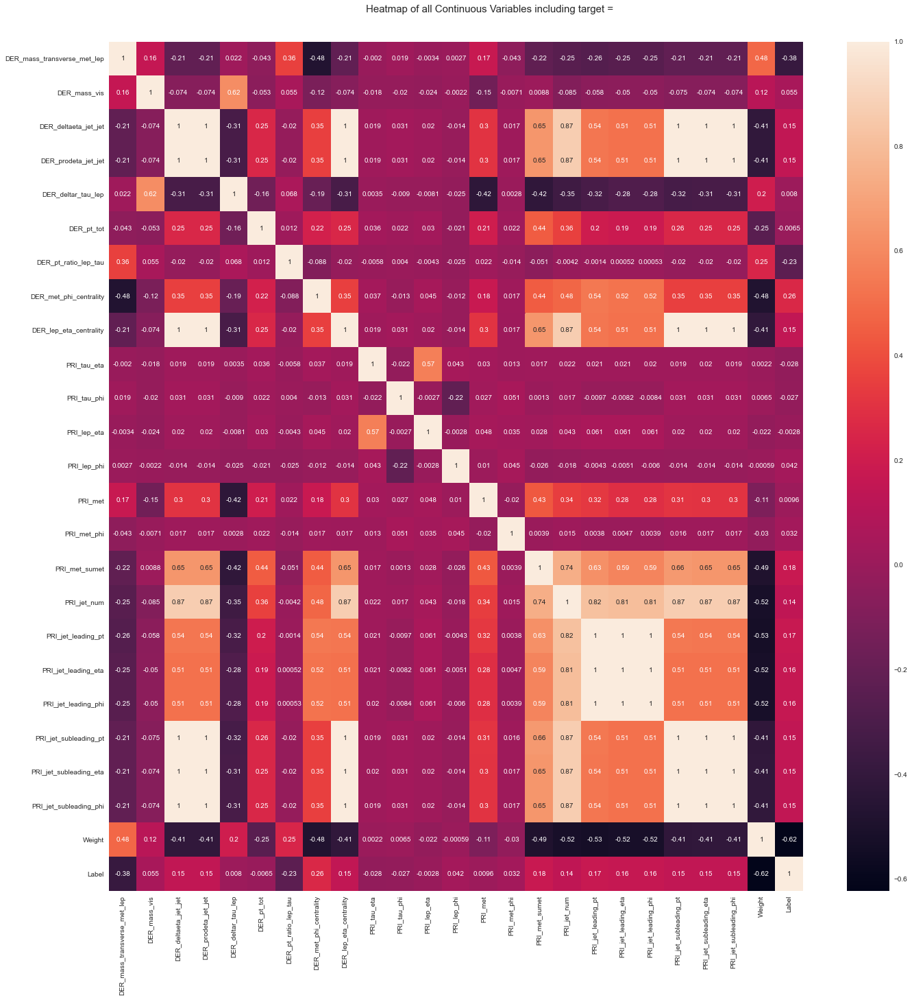

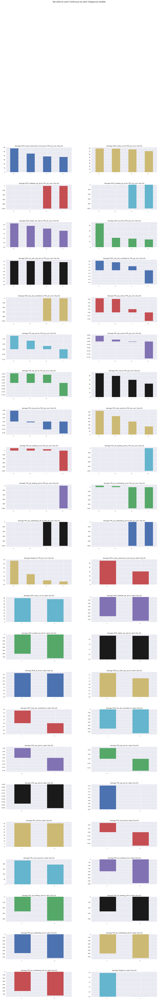

Time to run AutoViz (in seconds) = 72.320

 ###################### VISUALIZATION Completed ########################


,DER_mass_transverse_met_lep,DER_mass_vis,DER_deltaeta_jet_jet,DER_prodeta_jet_jet,DER_deltar_tau_lep,DER_pt_tot,DER_pt_ratio_lep_tau,DER_met_phi_centrality,DER_lep_eta_centrality,PRI_tau_eta,...,PRI_met_sumet,PRI_jet_num,PRI_jet_leading_pt,PRI_jet_leading_eta,PRI_jet_leading_phi,PRI_jet_subleading_pt,PRI_jet_subleading_eta,PRI_jet_subleading_phi,Weight,Label
153714,37.500,70.642,-999.000,-999.000,2.852,1.776,1.046,-1.223,-999.000,1.756,...,112.9620,1,33.863,-1.570,-0.713,-999.000,-999.000,-999.000,2.413414,0
71792,83.400,104.596,-999.000,-999.000,2.494,1.343,1.170,-1.409,-999.000,-2.189,...,153.5770,0,-999.000,-999.000,-999.000,-999.000,-999.000,-999.000,4.405623,0
15000,4.166,102.140,-999.000,-999.000,3.153,3.108,0.906,-1.403,-999.000,-1.208,...,128.6810,0,-999.000,-999.000,-999.000,-999.000,-999.000,-999.000,0.018636,1
18009,29.240,99.010,-999.000,-999.000,1.214,23.884,0.488,-0.674,-999.000,0.401,...,449.8732,1,181.035,-0.722,-2.742,-999.000,-999.000,-999.000,0.002653,1
6569,30.320,74.336,-999.000,-999.000,2.588,1.400,1.072,1.410,-999.000,-0.318,...,104.9990,1,39.967,-0.367,2.793,-999.000,-999.000,-999.000,0.018636,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
171337,41.637,93.143,-999.000,-999.000,2.481,5.868,0.801,-1.269,-999.000,1.616,...,164.1780,1,33.488,-3.064,-2.110,-999.000,-999.000,-999.000,0.018636,1
196804,20.593,58.072,1.023,5.126,0.724,26.958,0.488,1.414,0.028,1.639,...,449.8732,2,374.118,1.810,2.059,31.708,2.832,0.139,0.073899,0
24302,72.413,48.217,-999.000,-999.000,1.796,11.203,1.670,-1.408,-999.000,-0.110,...,94.4360,0,-999.000,-999.000,-999.000,-999.000,-999.000,-999.000,2.386403,0
37279,15.307,45.744,-999.000,-999.000,1.709,19.740,1.251,1.298,-999.000,1.097,...,222.0780,1,102.280,1.757,-0.495,-999.000,-999.000,-999.000,1.454848,0


In [ ]:
#with verbose=2 graph is not printed out
#here if you have changed a dataframe set so provide filename to be empty and provide value in dfte
AV.AutoViz(filename="", sep=',', depVar='', dfte=df_percent, header=0, verbose=1,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)

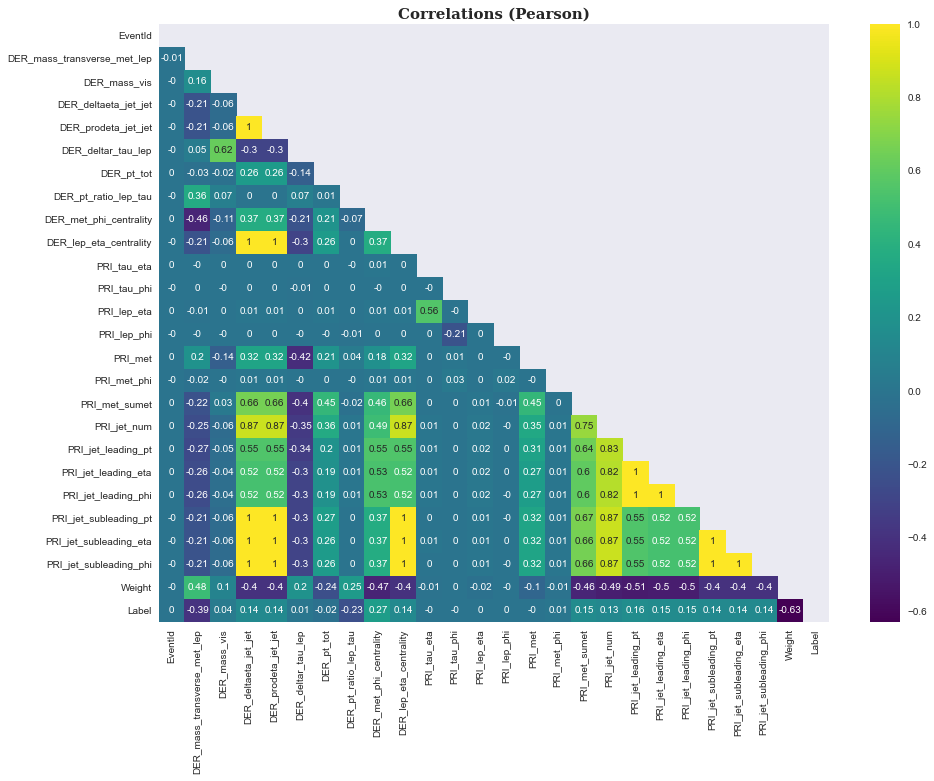

In [ ]:
def corr_plot(data,
              top_visible = False, right_visible = False, 
              bottom_visible = True, left_visible = False,
              ylabel = None, figsize = (15, 11), axis_grid = 'y'):
    fig, ax = plt.subplots(figsize = figsize)
    plt.title('Correlations (Pearson)', size = 15, fontweight = 'bold', fontfamily = 'serif')
    
    mask = np.triu(np.ones_like(data.corr(), dtype = bool))
    sns.heatmap(round(data.corr(), 2), mask = mask, cmap = 'viridis', annot = True)
    plt.show()
corr_plot(df)

In [13]:
#Selecting columns with corr matrix greates than 0.2 and less than -0.2 as it all assembles to be similar
df = df[['DER_mass_transverse_met_lep','DER_pt_ratio_lep_tau','DER_met_phi_centrality','Weight' ,'Label']]
df

,DER_mass_transverse_met_lep,DER_pt_ratio_lep_tau,DER_met_phi_centrality,Weight,Label
0,51.6550,1.582,1.396,0.002653,1
1,68.7680,0.879,1.414,2.233584,0
2,104.6442,2.897,1.414,2.347389,0
3,81.4170,2.354,-1.285,5.446378,0
4,16.9150,1.056,-1.385,6.245333,0
...,...,...,...,...,...
249995,71.9890,1.258,-1.414,4.505083,0
249996,58.1790,1.162,-1.345,2.497259,0
249997,60.5260,1.202,0.529,0.018636,1
249998,19.3620,0.999,1.414,1.681611,0


In [14]:
from sklearn.model_selection import train_test_split
X = df.drop(columns=['Label'])
y = df['Label']
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.1)

In [18]:
import tensorflow as tf 
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

In [23]:
# baseline model
def create_baseline():
    # create model
    model = Sequential()
    model.add(Dense(20, input_dim=4, activation='relu'))
    model.add(Dense(1, activation='sigmoid'))
    # Compile model
    opt = tf.keras.optimizers.Adam(learning_rate=0.01)
    model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
    return model

In [24]:
model = create_baseline()

In [26]:
history = model.fit(X_train,y_train,validation_data =(X_test,y_test), epochs=130,callbacks=EarlyStopping(monitor='val_loss',patience=1))

Epoch 1/130
7032/7032 [==============================] - 11s 2ms/step - loss: 0.0041 - accuracy: 0.9994 - val_loss: 0.0011 - val_accuracy: 1.0000
Epoch 2/130
7032/7032 [==============================] - 11s 2ms/step - loss: 4.5445e-04 - accuracy: 1.0000 - val_loss: 1.6094e-05 - val_accuracy: 1.0000
Epoch 3/130
7032/7032 [==============================] - 12s 2ms/step - loss: 0.0029 - accuracy: 0.9996 - val_loss: 7.5265e-04 - val_accuracy: 1.0000


In [27]:
tf.keras.models.save_model(model,'Higgs.h5')

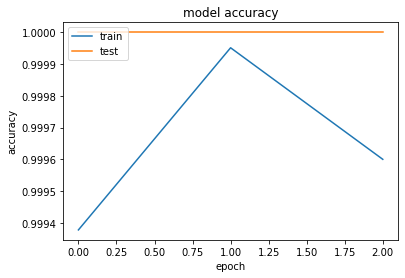

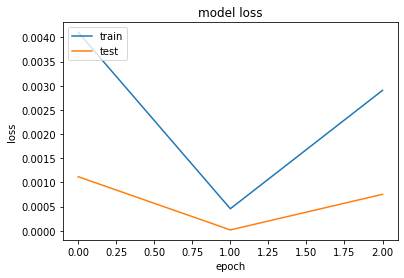

In [28]:

import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [29]:
model1 = tf.keras.models.load_model('Higgs.h5')

In [30]:
model.predict(X_test)

array([[0.9988496],
       [0.       ],
       [0.       ],
       ...,
       [0.       ],
       [0.       ],
       [0.       ]], dtype=float32)

In [31]:
def prediction(model,input):
    prediction = model.predict(input)
    return 's' if prediction[0][0] >= 0.5 else 'b'

prediction(model1,np.array([[19.3620,   0.936,-1.285,4.505083]]))

'b'

In [32]:
model = tf.keras.models.load_model('Higgs.h5')
model

In [ ]:
from google.colab import drive
drive.mount('/content/drive')